
---

**Przedmiot:** Uczenie Głębokie<br>
**Moduł:** 3 (Reimplementacja modeli neuronowych)<br>
**Laboratoria:** 4<br>
**Opis laboratoriów:** Poniższy skrypt omawia funkcjonalność metody NeRF pozwalającej rekonstruować trójwymiarową scenę na podstawie dwuwymiarowych obrazów. Skrypt ma za zadanie zapoznać z nowoczesnymi metodami reprezentacji sceny.

Dane oraz wagi modelu są dostępne
[na Dysku Google](https://drive.google.com/drive/folders/1vT8a40zxOqupUzmQ0_qbWDQU8TeXR-FP?usp=sharing).

---

# Funkcje pomocnicze

Do przećwiczenia zajęć potrzebna jest biblioteka PyTorch.

In [ ]:
import torch
import torch.nn as nn
import torch.utils.data
import torch.nn.functional as F
from torchvision.io import read_image

import glob
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from functools import cache
from ipywidgets import interact, FloatSlider, Text
from contextlib import contextmanager
from moviepy.editor import ImageSequenceClip
from IPython.display import HTML
import base64
import seaborn as sns
import pandas as pd

from google.colab import drive
drive.mount('/content/drive')

torch.set_float32_matmul_precision('high')

/usr/local/lib/python3.12/dist-packages/moviepy/config_defaults.py:47: SyntaxWarning: invalid escape sequence '\P'
  IMAGEMAGICK_BINARY = r"C:\Program Files\ImageMagick-6.8.8-Q16\magick.exe"
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:294: SyntaxWarning: invalid escape sequence '\d'
  lines_video = [l for l in lines if ' Video: ' in l and re.search('\d+x\d+', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:367: SyntaxWarning: invalid escape sequence '\d'
  rotation_lines = [l for l in lines if 'rotate          :' in l and re.search('\d+$', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:370: SyntaxWarning: invalid escape sequence '\d'
  match = re.search('\d+$', rotation_line)
  if event.key is 'enter':

  _C._set_float32_matmul_precision(precision)



Mounted at /content/drive


# NeRF


Metoda NeRF (Neural Radiance Fields) to nowatorskie podejście do modelowania scen trójwymiarowych na podstawie obrazów dwuwymiarowych. Wykorzystuje (stosunkowo proste) głębokie sieci neuronowe do reprezentacji pola radiacyjnego, które opisuje, jak światło emitowane lub odbite od obiektów zmienia się w zależności od położenia i kierunku patrzenia. Dzięki temu możliwe jest realistyczne renderowanie scen 3D, nawet przy ograniczonej liczbie zdjęć wejściowych.

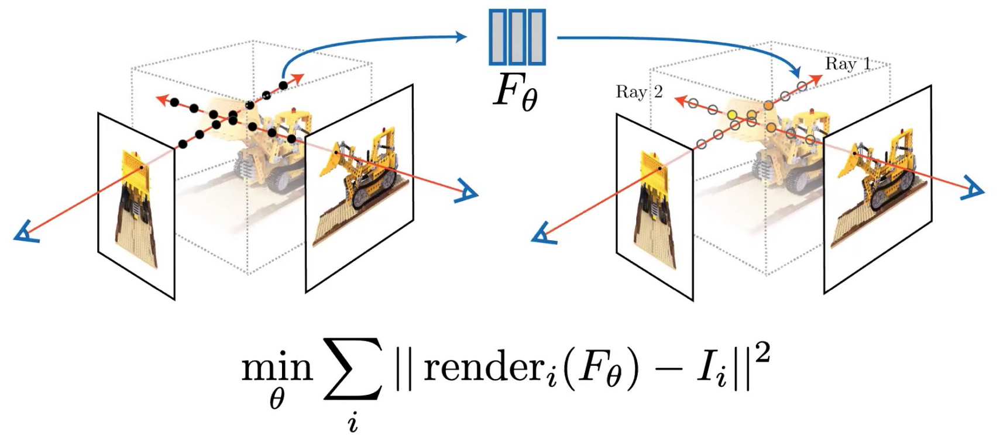

# Implementacja renderowania wolumetrycznego

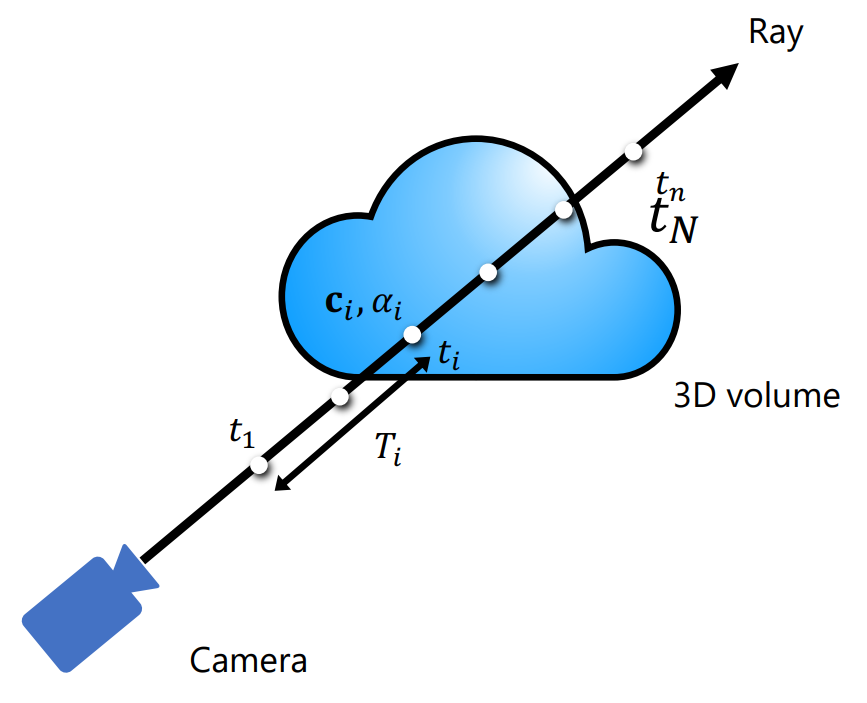

In [ ]:
#@torch.compile()
def render_rays(nerf_model, ray_origins, ray_directions, hn=0, hf=1, nb_bins=192):
    device = ray_origins.device

    # t = kolejne segmenty na promieniach
    t = torch.linspace(hn, hf, nb_bins, device=device).expand(ray_origins.shape[0], nb_bins)

    # dodajemy jednorodny szum wewnątrz promieni
    step = (hf - hn) / (nb_bins - 1)
    t = t + step * torch.rand(t.shape, device=device)

    delta = torch.cat((t[:, 1:] - t[:, :-1], torch.tensor([1e10], device=device).expand(ray_origins.shape[0], 1)), -1)

    # pozycje wszystkich segmentów
    x = ray_origins.unsqueeze(1) + t.unsqueeze(2) * ray_directions.unsqueeze(1)

    # dla każdego segmentu na promieniu kierunek jest oczywiście taki sam
    ray_directions = ray_directions.expand(nb_bins, ray_directions.shape[0], 3).transpose(0, 1)

    # odpytujemy model
    colors, sigma = nerf_model(x.reshape(-1, 3), ray_directions.reshape(-1, 3))

    # alpha = ile światła dostarcza segment przestrzeni o gęstości sigma i długości delta
    alpha = 1 - torch.exp(-sigma.reshape(x.shape[:-1]) * delta)  # [batch_size, nb_bins]

    # T = ile światła blokują wcześniejsze segmenty na drodze promienia
    T = torch.cat((torch.ones((alpha.shape[0], 1), device=device), torch.cumprod(1 - alpha, 1)[:, :-1]), dim=-1)

    weights = T.unsqueeze(2) * alpha.unsqueeze(2)
    return (weights * colors.reshape(x.shape)).sum(dim=1)  # Pixel values

In [ ]:
#@torch.compile()
def sample_batch(camera_extrinsics, camera_intrinsics, batch_size, H, W, img_index=0, sample_all=False):
    device = camera_intrinsics.device

    if sample_all:
        image_indices = (torch.zeros(W * H, device=device) + img_index).to(torch.long)
        u, v = torch.meshgrid(torch.linspace(0, W - 1, W, dtype=torch.int32, device=device), \
                              torch.linspace(0, H - 1, H, dtype=torch.int32, device=device), indexing="ij")
        u = u.reshape(-1)
        v = v.reshape(-1)
    else:
        image_indices = (torch.zeros(batch_size, device=device) + img_index).to(torch.long)
        u = torch.randint(W, (batch_size,), device=device)
        v = torch.randint(H, (batch_size,), device=device)

    focal = camera_intrinsics[0] ** 2 * W
    t = camera_extrinsics[img_index, :3]
    r = camera_extrinsics[img_index, -3:]

    # Macierz transformacji z przestrzeni kamery do przestrzeni świata
    # Punkt 4.1 w artykule NeRF−− https://arxiv.org/pdf/2102.07064
    phi_skew = torch.stack([torch.cat([torch.zeros(1, device=device), -r[2:3], r[1:2]]),
                            torch.cat([r[2:3], torch.zeros(1, device=device), -r[0:1]]),
                            torch.cat([-r[1:2], r[0:1], torch.zeros(1, device=device)])], dim=0)
    alpha = r.norm() + 1e-15
    R = torch.eye(3, device=device) + (torch.sin(alpha) / alpha) * phi_skew + (
            (1 - torch.cos(alpha)) / alpha ** 2) * (phi_skew @ phi_skew)
    c2w = torch.cat([R, t.unsqueeze(1)], dim=1)
    c2w = torch.cat([c2w, torch.tensor([[0., 0., 0., 1.]], device=device)], dim=0)

    rays_d_cam = torch.cat([((u - .5 * W) / focal).unsqueeze(-1),
                            (-(v - .5 * H) / focal).unsqueeze(-1),
                            - torch.ones_like(u).unsqueeze(-1)], dim=-1)
    rays_d_world = torch.matmul(c2w[:3, :3].view(1, 3, 3), rays_d_cam.unsqueeze(2)).squeeze(2)
    rays_o_world = c2w[:3, 3].view(1, 3).expand_as(rays_d_world)

    return rays_o_world, F.normalize(rays_d_world, p=2, dim=1), (image_indices, v, u)

In [ ]:
def compute_regularization_loss(nerf_model, aabb_min, aabb_max, num_samples=1000):
    # Ensure aabb_min and aabb_max are tensors if not already
    aabb_min = torch.as_tensor(aabb_min, dtype=torch.float32)
    aabb_max = torch.as_tensor(aabb_max, dtype=torch.float32)

    # Generate random points within AABB
    random_points = torch.rand((num_samples, 3), dtype=torch.float32, device=aabb_min.device)
    random_points = random_points * (aabb_max - aabb_min) + aabb_min

    # Generate dummy directions
    dummy_directions = torch.randn((num_samples, 3), dtype=torch.float32, device=aabb_min.device)
    dummy_directions = dummy_directions / dummy_directions.norm(dim=-1, keepdim=True)

    _, sigma = nerf_model(random_points.unsqueeze(0), dummy_directions.unsqueeze(0))
    sigma = sigma.squeeze(0)

    # Compute MSE loss (emptiness loss)
    emptiness_loss = (sigma ** 2).mean() # MSE against zero (implying mean square)
    return emptiness_loss

# Example usage:
# loss = compute_regularization_loss(nerf_model, aabb_min, aabb_max, num_samples=1000)

In [ ]:
@torch.no_grad()
def test(model, camera_intrinsics, camera_extrinsics, hn, hf, chunk_size=10, img_index=0, nb_bins=192, H=400, W=400):
    device = camera_intrinsics.device

    ray_origins, ray_directions, _ = sample_batch(camera_extrinsics, camera_intrinsics, None, H, W,
                                                  img_index=img_index, sample_all=True)

    data = []
    for i in range(int(np.ceil(H / chunk_size))):
        ray_origins_ = ray_origins[i * W * chunk_size: (i + 1) * W * chunk_size].to(device)
        ray_directions_ = ray_directions[i * W * chunk_size: (i + 1) * W * chunk_size].to(device)
        regenerated_px_values = render_rays(model, ray_origins_.contiguous(), ray_directions_.contiguous(), hn=hn, hf=hf, nb_bins=nb_bins)
        data.append(regenerated_px_values)
    img = torch.cat(data).data.cpu().numpy().reshape(H, W, 3)
    plt.imshow(img)
    # plt.savefig('novel_view.png', bbox_inches='tight')
    plt.show()

# Implementacja MLP

In [ ]:
def positional_encoding(x: torch.Tensor, L: int) -> torch.Tensor:
    freq = torch.pow(2, torch.arange(0, L, 1, device=x.device))
    freq = freq[..., None] * x[..., None, :]
    freq = freq.flatten(-2, -1)
    sin_arr = torch.sin(freq)
    cos_arr = torch.cos(freq)
    return torch.cat((x, sin_arr, cos_arr), dim=1)

x = torch.randn((2, 3))
positional_encoding(x, 2)

tensor([[-0.4096,  0.0409, -1.2734, -0.3983,  0.0409, -0.9561, -0.7306,  0.0817,
         -0.5603,  0.9173,  0.9992,  0.2930,  0.6828,  0.9967, -0.8283],
        [-0.0152, -1.4105, -1.7087, -0.0152, -0.9872, -0.9905, -0.0304, -0.3151,
          0.2724,  0.9999,  0.1596, -0.1375,  0.9995, -0.9491, -0.9622]])

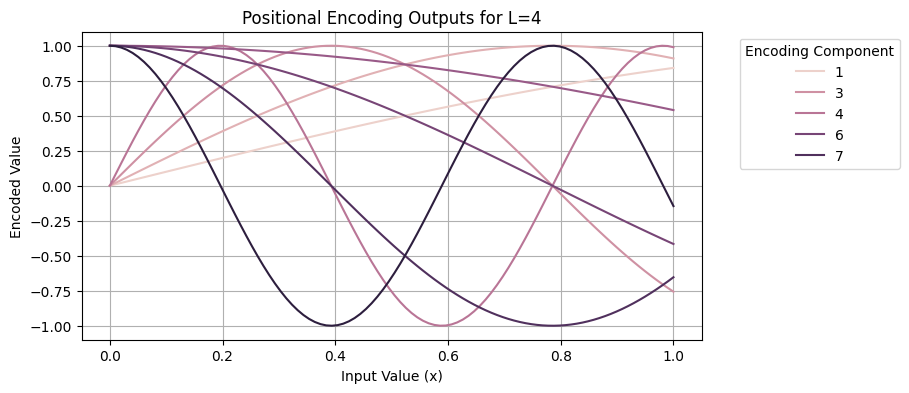

In [ ]:
x_input = torch.linspace(0, 1, 100).unsqueeze(-1)

encodings = positional_encoding(x_input, 4)

df = pd.DataFrame(encodings.numpy())
df.rename(columns={0: 'input'}, inplace=True)

df_melted = df.melt(id_vars='input', var_name='encoding_component', value_name='value')

plt.figure(figsize=(8, 4))
sns.lineplot(data=df_melted, x='input', y='value', hue='encoding_component')
plt.title('Positional Encoding Outputs for L=4')
plt.xlabel('Input Value (x)')
plt.ylabel('Encoded Value')
plt.legend(title='Encoding Component', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

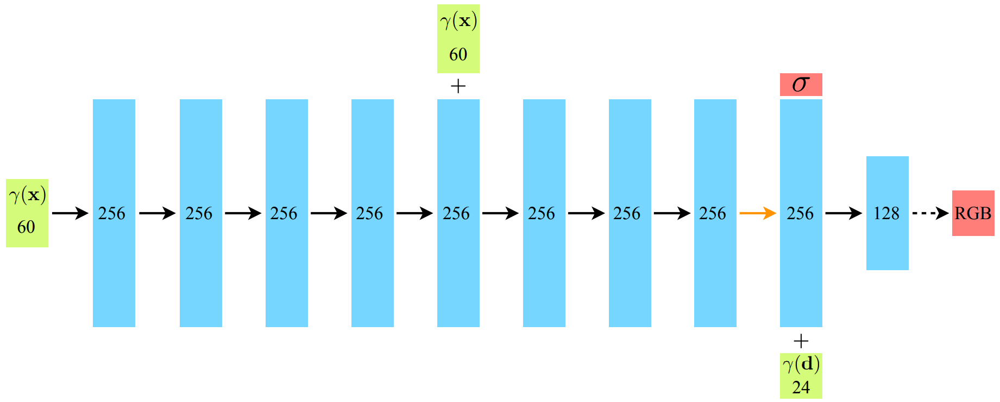

In [ ]:
class NerfModel(nn.Module):
    def __init__(self, embedding_dim_pos=10, embedding_dim_direction=5, hidden_dim=128):
        super(NerfModel, self).__init__()

        self.block1 = nn.Sequential(nn.Linear(embedding_dim_pos * 6 + 3, hidden_dim), nn.ReLU(),
                                    nn.Linear(hidden_dim, hidden_dim), nn.ReLU(),
                                    nn.Linear(hidden_dim, hidden_dim), nn.ReLU(),
                                    nn.Linear(hidden_dim, hidden_dim), nn.ReLU())
        self.block2 = nn.Sequential(nn.Linear(embedding_dim_pos * 6 + hidden_dim + 3, hidden_dim), nn.ReLU(),
                                    nn.Linear(hidden_dim, hidden_dim), nn.ReLU(),
                                    nn.Linear(hidden_dim, hidden_dim), nn.ReLU(),
                                    nn.Linear(hidden_dim, hidden_dim + 1))
        self.block3 = nn.Sequential(nn.Linear(embedding_dim_direction * 6 + hidden_dim + 3, hidden_dim // 2),
                                    nn.ReLU())
        self.block4 = nn.Sequential(nn.Linear(hidden_dim // 2, 3), nn.Sigmoid())

        self.embedding_dim_pos = embedding_dim_pos
        self.embedding_dim_direction = embedding_dim_direction
        self.relu = nn.ReLU()

    def forward(self, o, d):
        emb_x = positional_encoding(o, self.embedding_dim_pos)
        emb_d = positional_encoding(d, self.embedding_dim_direction)
        tmp = self.block2(torch.cat((self.block1(emb_x), emb_x), dim=1))
        h, sigma = tmp[:, :-1], self.relu(tmp[:, -1])
        c = self.block4(self.block3(torch.cat((h, emb_d), dim=1)))
        return c, sigma

# Ładowanie danych

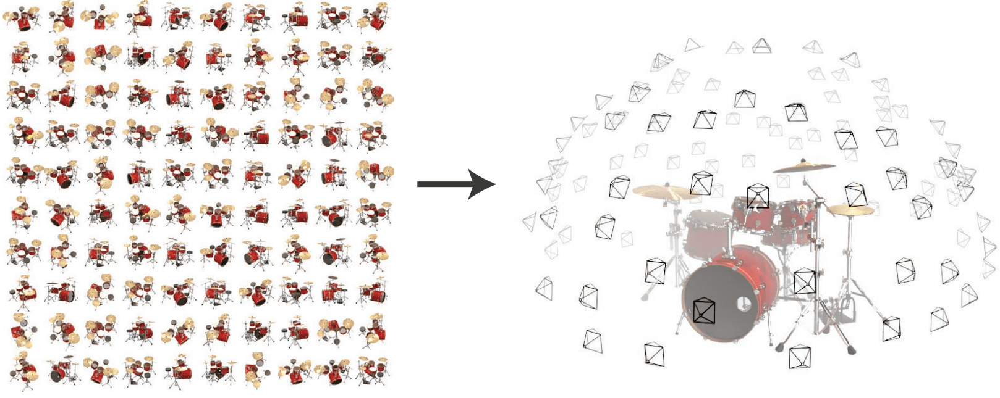

In [ ]:
def initialize_camera_parameters(images, device='cpu'):
    # Parametry wewnętrzne kamery: ogniskowa
    camera_intrinsics = torch.ones(1, device=device, requires_grad=True)

    # Parametry zewnętrzne kamery: pozycja i rotacja
    camera_extrinsics = torch.zeros((images.shape[0], 6), device=device, requires_grad=True)
    return camera_intrinsics, camera_extrinsics

In [ ]:
def load_images(data_path):
    image_paths = glob.glob(data_path)
    images = None
    for image_path in image_paths:
        img = read_image(image_path)[None, :3, ...].permute(0, 2, 3, 1)
        images = torch.concatenate((images, img)) if images is not None else img
    images = images.to(torch.float32) / 255
    return images

# Pętla ucząca

In [ ]:
def compute_regularization_loss(model, aabb_min, aabb_max, num_samples=1000):

    # Generate random points within AABB
    random_points = torch.rand((num_samples, 3), dtype=torch.float32, device=aabb_min.device)
    random_points = random_points * (aabb_max - aabb_min) + aabb_min

    # Generate dummy directions
    dummy_directions = torch.randn((num_samples, 3), dtype=torch.float32, device=aabb_min.device)
    dummy_directions = dummy_directions / dummy_directions.norm(dim=-1, keepdim=True)

    # Query NeRF model
    with torch.no_grad():
        _, sigma = model(random_points.unsqueeze(0), dummy_directions.unsqueeze(0))
        sigma = sigma.squeeze(0) # Remove batch dimension

    # Compute MSE loss (emptiness loss)
    emptiness_loss = (sigma ** 2).mean() # MSE against zero (implying mean square)
    return emptiness_loss

# Example usage:
# loss = compute_regularization_loss(nerf_model, aabb_min, aabb_max, num_samples=1000)

In [ ]:
def train(nerf_model, optimizers, schedulers, training_images, camera_extrinsics, camera_intrinsics, batch_size, nb_epochs, hn=0., hf=1., nb_bins=192, aabb_min=None, aabb_max=None, regularization_weight=0.):
    H, W = training_images.shape[1:3]

    training_loss = []
    for _ in tqdm(range(nb_epochs)):
        ids = np.arange(training_images.shape[0])
        np.random.shuffle(ids)
        ids = torch.from_numpy(ids).to(camera_extrinsics.device)
        for img_index in ids:
            rays_o, rays_d, samples_idx = sample_batch(camera_extrinsics, camera_intrinsics, batch_size, H, W, img_index=img_index)

            samples_idx = tuple([x.cpu() for x in samples_idx])
            gt_px_values = training_images[samples_idx].to(camera_intrinsics.device)
            regenerated_px_values = render_rays(nerf_model, rays_o.contiguous(), rays_d.contiguous(), hn=hn, hf=hf, nb_bins=nb_bins)
            reconstruction_loss = ((gt_px_values - regenerated_px_values) ** 2).sum()

            # Compute regularization loss
            if aabb_min is not None and aabb_max is not None and regularization_weight > 0:
                reg_loss = compute_regularization_loss(nerf_model, aabb_min, aabb_max)
                loss = reconstruction_loss + regularization_weight * reg_loss
            else:
                loss = reconstruction_loss

            for optimizer in optimizers:
                optimizer.zero_grad()
            loss.backward()
            for optimizer in optimizers:
                optimizer.step()
            training_loss.append(loss.item())
        for scheduler in schedulers:
            scheduler.step()
    return training_loss

# Uczenie modelu

In [ ]:
import torch.nn as nn

#device = 'cuda:0'
device = 'cuda'
nb_epochs = 100
# training_images = load_images("ai/*.png")
training_images = load_images("/content/drive/MyDrive/.Phd/UG/NeRF/ai/*.png")
camera_intrinsics_tensor, camera_extrinsics_tensor = initialize_camera_parameters(training_images, device=device)

camera_intrinsics = nn.Parameter(camera_intrinsics_tensor)
camera_extrinsics = nn.Parameter(camera_extrinsics_tensor)

batch_size = 2048

# Define hn_val and hf_val from the train function call
hn_val = 0.
hf_val = 1.

# Set regularization weight
regularization_weight = 1e-3

# Extract camera origins from camera_extrinsics (translation vectors)
# Assuming camera_extrinsics are in the format [R|t] where t is the last 3 columns
camera_origins = camera_extrinsics_tensor[:, 3:]

# Calculate min and max coordinates across all initial camera origins
aabb_min_origins = torch.min(camera_origins, dim=0)[0]
aabb_max_origins = torch.max(camera_origins, dim=0)[0]

# Expand the AABB by 'hf_val' to encompass the potential scene volume around camera origins
# This is a heuristic to define a box where the scene might be.
expansion_margin = hf_val # Use far plane as a heuristic for scene depth.
aabb_min_computed = aabb_min_origins - expansion_margin
aabb_max_computed = aabb_max_origins + expansion_margin

# Ensure aabb is on the correct device
aabb_min_computed = aabb_min_computed.to(device)
aabb_max_computed = aabb_max_computed.to(device)

print(f"Computed AABB Min for regularization: {aabb_min_computed}")
print(f"Computed AABB Max for regularization: {aabb_max_computed}")


# Część 1: wspólne uczenie modelu i parametrów kamery
model = NerfModel(hidden_dim=256).to(device)

model_optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
optimizer_camera_parameters = torch.optim.AdamW({camera_extrinsics}, lr=0.0009)
optimizer_focal = torch.optim.AdamW({camera_intrinsics}, lr=0.001)

scheduler_model = torch.optim.lr_scheduler.MultiStepLR(model_optimizer, [10 * (i + 1) for i in range(nb_epochs // 10)], gamma=0.9954)
scheduler_camera_parameters = torch.optim.lr_scheduler.MultiStepLR(optimizer_camera_parameters, [100 * (i + 1) for i in range(nb_epochs // 100)], gamma=0.81)
scheduler_focal = torch.optim.lr_scheduler.MultiStepLR(optimizer_focal, [100 * (i + 1) for i in range(nb_epochs // 100)], gamma=0.9)

train(model, [model_optimizer, optimizer_camera_parameters, optimizer_focal],
    [scheduler_model, scheduler_camera_parameters, scheduler_focal], training_images, camera_extrinsics,
    camera_intrinsics, batch_size, nb_epochs, hn=hn_val, hf=hf_val, nb_bins=192, aabb_min=aabb_min_computed, aabb_max=aabb_max_computed, regularization_weight=regularization_weight)

# Część 2: uczenie modelu (od zera) przy stałych parametrach kamery
model = NerfModel(hidden_dim=256).to(device)

model_optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
scheduler_model = torch.optim.lr_scheduler.MultiStepLR(model_optimizer, [10 * (i + 1) for i in range(nb_epochs // 10)], gamma=0.9954)

train(model, [model_optimizer], [scheduler_model], training_images, camera_extrinsics,
    camera_intrinsics, batch_size, nb_epochs, hn=hn_val, hf=hf_val, nb_bins=192, aabb_min=aabb_min_computed, aabb_max=aabb_max_computed, regularization_weight=regularization_weight)

#test(model, camera_intrinsics, (.5 * camera_extrinsics[0] + .5 * camera_extrinsics[1]).unsqueeze(0), 0., 1., img_index=0, nb_bins=192, H=training_images.shape[1], W=training_images.shape[2])

 51%|█████     | 51/100 [05:35<05:22,  6.59s/it]


KeyboardInterrupt: 

In [ ]:
torch.save(model.state_dict(), "nerf.pt")
torch.save(camera_extrinsics, "camera_extrinsics.pt")

# Odpytywanie modelu

In [ ]:
model.load_state_dict(torch.load("/content/drive/MyDrive/.Phd/UG/NeRF/nerf.pt", map_location="cpu"))
camera_extrinsics = torch.load("/content/drive/MyDrive/.Phd/UG/NeRF/camera_extrinsics.pt", map_location="cpu")

In [ ]:
@torch.inference_mode()
def render_img(model, camera_intrinsics, camera_extrinsics, hn, hf, chunk_size=10, nb_bins=192, H=400, W=400):
    ray_origins, ray_directions, _ = sample_batch(camera_extrinsics, camera_intrinsics, None, H, W, sample_all=True)

    data = []
    for i in range(int(np.ceil(H / chunk_size))):
        ray_origins_ = ray_origins[i * W * chunk_size: (i + 1) * W * chunk_size].to(camera_intrinsics.device)
        ray_directions_ = ray_directions[i * W * chunk_size: (i + 1) * W * chunk_size].to(camera_intrinsics.device)
        regenerated_px_values = render_rays(model, ray_origins_, ray_directions_, hn=hn, hf=hf, nb_bins=nb_bins)
        data.append(regenerated_px_values)

    img = torch.cat(data).data.cpu().reshape(H, W, 3).transpose(0, 1).numpy()
    return img

In [ ]:
@cache
def cached_render_img(camera_extrinsics):
    camera_extrinsics = torch.asarray(list(camera_extrinsics), device=device)
    return render_img(model, camera_intrinsics, camera_extrinsics.unsqueeze(0), 0., 1., chunk_size=2, nb_bins=192, H=100, W=100)

In [ ]:
%matplotlib inline

min_values = camera_extrinsics.detach().amin(axis=0).cpu().numpy()
mean_values = camera_extrinsics.detach().mean(axis=0).cpu().numpy()
max_values = camera_extrinsics.detach().amax(axis=0).cpu().numpy()
step_values = (max_values - min_values) / 5

sliders = {name: FloatSlider(value=mean_value, min=min_value, max=max_value, step=step_value) for name, min_value, mean_value, max_value, step_value in zip("abcdef", min_values, mean_values, max_values, step_values)}
label = Text('Ready')

@contextmanager
def show_loading():
    label.value = 'Running...'
    yield
    label.value = 'Ready'

def plot_func(**kwargs):
    with show_loading():
        img = cached_render_img(tuple(kwargs.values()))
        # print(img.shape)
        plt.imshow(img)
        plt.show()

display(label)
interact(plot_func, **sliders)

Text(value='Ready')

interactive(children=(FloatSlider(value=-0.0008840967784635723, description='a', max=0.005367809906601906, min…

<function __main__.plot_func(**kwargs)>

In [ ]:
v = mean_values.copy()
v[1] = 0
v[2] = 0
frames = []
for a in tqdm(np.linspace(-0.1, 0.1, 6)):
    v[0] = a
    frame = cached_render_img(tuple(v))
    frames.append(frame*255)

for b in tqdm(np.linspace(0, 0.02, 2)):
    v[1] = b
    frame = cached_render_img(tuple(v))
    frames.append(frame*255)

for a in tqdm(np.linspace(0.1, -0.1, 6)):
    v[0] = a
    frame = cached_render_img(tuple(v))
    frames.append(frame*255)

for b in tqdm(np.linspace(0.02, 0, 2)):
    v[1] = b
    frame = cached_render_img(tuple(v))
    frames.append(frame*255)

100%|██████████| 2/2 [00:00<00:00, 9020.01it/s]


In [ ]:
clip = ImageSequenceClip(list(frames), fps=30)
clip.write_gif('test2.gif', fps=30)

MoviePy - Building file test2.gif with imageio.



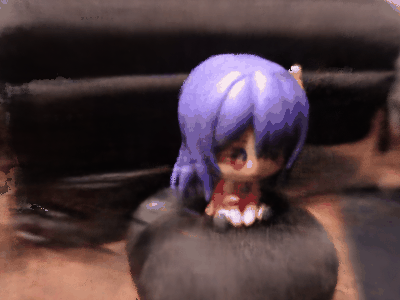

In [ ]:
b64 = base64.b64encode(open("./test2.gif", "rb").read()).decode("ascii")
display(HTML(f'<img src="data:image/gif;base64,{b64}" />'))


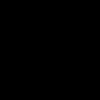

In [ ]:
b64 = base64.b64encode(open("./test2.gif", "rb").read()).decode("ascii")
display(HTML(f'<img src="data:image/gif;base64,{b64}" />'))